<a href="https://colab.research.google.com/github/DomWatcharin/Geospatial/blob/main/SAM/SAM_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ติดตั้ง Python Libraries**

ใช้ Runtime -> Change runtime type เลือก GPU ก่อน

In [1]:
!pip install segment-geospatial

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 70.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.2/40.2 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 46.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 53.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 44.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 35.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 34.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.4 MB/s eta 0:00:00


In [2]:
!pip install leafmap localtileserver

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 40.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.4/19.4 MB 72.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 76.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.5/130.5 kB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 100.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 79.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 84.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.3/71.3 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━

# **Import Lib**

In [3]:
import os
import leafmap
from samgeo import SamGeo, tms_to_geotiff, get_basemaps

# **กำหนด ขอบเขต BBOX ที่ต้องการ Download ภาพ**

ให้ทำการลากขอบเขต กรอบสี่เหลี่ยม ด้วยเครื่องมือบนแผนที่ ด้านล่าง เพื่อระบุ bbox พื้นที่ศึกษาที่ต้องการ

In [9]:
m = leafmap.Map(center=[14.880344, 102.018771], zoom=17, height='800px')
m.add_basemap('SATELLITE')
m

Map(center=[14.880344, 102.018771], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title'…

ถ้าไม่ลากสี่เหลี่ยมกำหนด bbox จะใช้ค่า defalut

In [10]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [100.56472778320312,14.243086862716888,100.56610107421875,14.244417935669624]

print(bbox)

[102.0167, 14.8762, 102.02, 14.8787]


ตั้งชื่อไฟล์ภาพที่ต้องการบันทึกการดาวน์โหลดด้วย TMS2GEOTIFF

In [11]:
image = 'satellite1.tif'
tms_to_geotiff(output=image, bbox=bbox, zoom=20, source='Satellite', overwrite=True)

Downloaded image 1/80
Downloaded image 2/80
Downloaded image 3/80
Downloaded image 4/80
Downloaded image 5/80
Downloaded image 6/80
Downloaded image 7/80
Downloaded image 8/80
Downloaded image 9/80
Downloaded image 10/80
Downloaded image 11/80
Downloaded image 12/80
Downloaded image 13/80
Downloaded image 14/80
Downloaded image 15/80
Downloaded image 16/80
Downloaded image 17/80
Downloaded image 18/80
Downloaded image 19/80
Downloaded image 20/80
Downloaded image 21/80
Downloaded image 22/80
Downloaded image 23/80
Downloaded image 24/80
Downloaded image 25/80
Downloaded image 26/80
Downloaded image 27/80
Downloaded image 28/80
Downloaded image 29/80
Downloaded image 30/80
Downloaded image 31/80
Downloaded image 32/80
Downloaded image 33/80
Downloaded image 34/80
Downloaded image 35/80
Downloaded image 36/80
Downloaded image 37/80
Downloaded image 38/80
Downloaded image 39/80
Downloaded image 40/80
Downloaded image 41/80
Downloaded image 42/80
Downloaded image 43/80
Downloaded image 44/

กรณีมีภาพในเครื่องก็ upload ขึ้น colab หรือดึงจาก Gdrive ได้เลย แล้วกำหนด *****

In [ ]:
# สามารภ upload ภาพถ่ายจากโดรน หรือภาพรายละเอียดสูงของท่านขึ้น colab ก็ได้
# หรือจะโยนขึ้น Google Drive แล้ว mount เข้ามาเชื่อม google drive กับ google colab 
#from google.colab import drive
#drive.mount('/content/drive',force_remount=True)

#กำหนด path หาไฟล์ของท่านบน google drive
#image = './drive/image/drone.tif'

ทดสอบการแสดงผลข้อมูลภาพ geotiff ที่จะใช้รัน SAM ด้วยการเปิดซ้อนบน Leaflet App

In [12]:
m.layers[-1].visible = False
m.add_raster(image, layer_name='Image')
m

Map(bottom=15374808.0, center=[14.880344, 102.018771], controls=(ZoomControl(options=['position', 'zoom_in_tex…

# **Initialize SAM class**

In [13]:
import torch
import torchvision
import cv2
import matplotlib.pyplot as plt
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10

In [14]:
out_dir = os.path.join(os.path.expanduser('~'), 'Downloads')
checkpoint = os.path.join(out_dir, 'sam_vit_h_4b8939.pth')

Download และเรียกใช้งาน SAM model โดยจะไปเก็บที่ "/root/Download/sam_vit_h_4b8939.pth"

In [ ]:
# Availble SamEO arguments:
# checkpoint="sam_vit_h_4b8939.pth",
# model_type='vit_h',
# device='cpu',
# erosion_kernel=(3, 3),
# mask_multiplier=255,
# sam_kwargs=None

# Availble sam_kwargs:
# points_per_side: Optional[int] = 32,
# points_per_batch: int = 64,
# pred_iou_thresh: float = 0.88,
# stability_score_thresh: float = 0.95,
# stability_score_offset: float = 1.0,
# box_nms_thresh: float = 0.7,
# crop_n_layers: int = 0,
# crop_nms_thresh: float = 0.7,
# crop_overlap_ratio: float = 512 / 1500,
# crop_n_points_downscale_factor: int = 1,
# point_grids: Optional[List[np.ndarray]] = None,
# min_mask_region_area: int = 0,
# output_mode: str = "binary_mask",

In [15]:
sam_kwargs = {
    'points_per_side': 32,
    'pred_iou_thresh': 0.86,
    'stability_score_thresh': 0.92,
    'crop_n_layers': 1,
    'crop_n_points_downscale_factor': 2,
    'min_mask_region_area': 100,
}

In [16]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
sam = SamGeo(
    checkpoint=checkpoint,
    model_type='vit_h',
    device=device,
    erosion_kernel=(3, 3),
    mask_multiplier=255,
    sam_kwargs=None,
)

Checkpoint /root/Downloads/sam_vit_h_4b8939.pth does not exist.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/Downloads/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:10<00:00, 254MB/s]


# **Run Mask generation**

In [17]:
mask = 'segment1.tiff'
sam.generate(image, mask)

ตรวจสอบภาพผลลัพธ์

<Figure size 2000x1000 with 0 Axes>

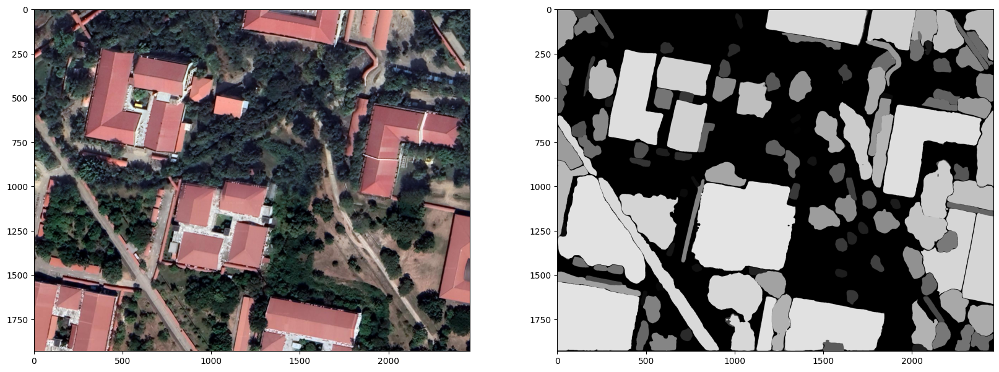

In [18]:
pred_image = cv2.cvtColor(cv2.imread(mask), cv2.COLOR_BGR2RGB)
tiff_image = cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB)

plt.figure()
f, axarr = plt.subplots(1,2)
axarr[0].imshow(tiff_image)
axarr[1].imshow(pred_image)
plt.show()

# **Polygonize the raster data**

แปลง mask ไปเป็น vetor file กำหนดชื่อไฟล์ที่ต้องการ เลือกได้ทั้ง Geojson, shp , geopackage

In [19]:
vector = 'segment1.gpkg'
sam.tiff_to_gpkg(mask, vector, simplify_tolerance=None)

ทดลองแสดงผล Vector , Mask Layer บน Leaflet App

In [20]:
style2 = {
    'color': '#3388ff',
    'weight': 2,
    'fillColor': '#7c4185',
    'fillOpacity': 0.15,
}
m.add_vector(vector, layer_name='Vector', style=style2)
m

Map(bottom=30749774.0, center=[14.877450000000001, 102.01835], controls=(ZoomControl(options=['position', 'zoo…